# Query and Stack Imagery into a GIF Using stackstac and Dask

**Attribution**: This tutorial is developed based on the [example](https://stackstac.readthedocs.io/en/latest/examples/gif.html) provided in the stackstac documentation. 

We'll load all the [Landsat-8 (Collection 2, Level 2)](https://planetarycomputer.microsoft.com/dataset/landsat-8-c2-l2) data that's available from [Microsoft's Planetary Computer](https://planetarycomputer.microsoft.com/) over a small region on the coast of [Cape Cod](https://www.google.com/maps/place/Chatham,+MA/@41.7498076,-70.2026227,10.73z/data=!4m13!1m7!3m6!1s0x89fb15440149e94d:0x1f9c0efa001cb20b!2sCape+Cod!3b1!8m2!3d41.6687897!4d-70.2962408!3m4!1s0x89fb142168afbe53:0x714436ec7d485a53!8m2!3d41.6821432!4d-69.9597359), Massachusetts, USA.

Using nothing but standard xarray syntax, we'll mask cloudy pixels with the Landsat QA band and reduce the data down to biannual median composites. We will use Dask to make this much faster. 

[Animated](https://geogif.readthedocs.io/en/latest/) as a GIF, we can watch the coastline move over the years due to [longshore drift](https://en.wikipedia.org/wiki/Longshore_drift).

In [1]:
import dask
import pystac_client
import planetary_computer
import leafmap
import geogif
import stackstac

Start your Dask cluster:

In [2]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 23.20 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37197,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 23.20 GiB
Comm: tcp://127.0.0.1:40931,Total threads: 2
Dashboard: http://127.0.0.1:38735/status,Memory: 5.80 GiB
Nanny: tcp://127.0.0.1:45505,


Interactively pick the area of interest from a map. Just move the map around and re-run all cells to generate the timeseries somewhere else!

In [3]:
import leafmap

In [4]:
m = leafmap.Map(center=[41.64933994767867, -69.94438630063088], zoom=11, height="800px")
m

Map(center=[41.64933994767867, -69.94438630063088], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [5]:
bbox = (m.west, m.south, m.east, m.north)

## Search for STAC items

Use [pystac-client](https://github.com/stac-utils/pystac-client) to connect to Microsoft's STAC API endpoint and search for Landsat-8 scenes.

In [6]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [7]:
search = catalog.search(
    collections=['landsat-8-c2-l2'],
    bbox=bbox,
)

Load all the STAC items:

In [8]:
items = search.get_all_items()
len(items)

401

These are the footprints of all the items we'll use:

In [9]:
m.add_geojson(items.to_dict(), zoom_to_layer=True)
m

Map(bottom=195710.0, center=[41.64933994767867, -69.94438630063088], controls=(ZoomControl(options=['position'…

## Create an xarray with stacksatc

Set `bounds_latlon=bbox` to automatically clip to our area of interest (instead of using the full footprints of the scenes).

In [10]:
%%time
stack = stackstac.stack(items, bounds_latlon=bbox)
stack

CPU times: user 455 ms, sys: 13.6 ms, total: 468 ms
Wall time: 462 ms


<xarray.DataArray 'stackstac-a5d05ed841b7fe34bd4bf1fffead24d1' (time: 401,
                                                                band: 19,
                                                                y: 1538, x: 1627)> Size: 153GB
dask.array<fetch_raster_window, shape=(401, 19, 1538, 1627), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/27)
  * time                         (time) datetime64[ns] 3kB 2013-03-22T15:19:0...
    id                           (time) <U31 50kB 'LC08_L2SP_011031_20130322_...
  * band                         (band) <U13 988B 'SR_B1' ... 'SR_QA_AEROSOL'
  * x                            (x) float64 13kB 3.969e+05 ... 4.456e+05
  * y                            (y) float64 12kB 4.634e+06 ... 4.588e+06
    description                  (band) <U91 7kB 'Collection 2 Level-2 Coasta...
    ...                           ...
    title                        (band) <U46 3kB 'Coastal/Aerosol Band (B1)' ...
    gsd                          (band) float64 152B 30.0 30.0 ... 30.0 30.0
    common_name                  (band) object 152B 'coastal' 'blue' ... None
    center_wavelength            (band) object 152B 0.44 0.48 0.56 ... None None
    full_width_half_max          (band) object 152B 0.02 0.06 0.06 ... None None
    epsg                         int64 8B 32619
Attributes:
    spec:        RasterSpec(epsg=32619, bounds=(396870.0, 4588200.0, 445680.0...
    crs:         epsg:32619
    transform:   | 30.00, 0.00, 396870.00|\n| 0.00,-30.00, 4634340.00|\n| 0.0...
    resolution:  30.0

And that's it for stackstac! Everything from here on is just standard xarray operations.

Band names are not trivial from the initial query:

In [11]:
stack.band 

<xarray.DataArray 'band' (band: 19)> Size: 988B
array(['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B6', 'SR_B7', 'ST_QA',
       'ST_B10', 'ST_DRAD', 'ST_EMIS', 'ST_EMSD', 'ST_TRAD', 'ST_URAD',
       'QA_PIXEL', 'ST_ATRAN', 'ST_CDIST', 'QA_RADSAT', 'SR_QA_AEROSOL'],
      dtype='<U13')
Coordinates: (12/16)
  * band                       (band) <U13 988B 'SR_B1' ... 'SR_QA_AEROSOL'
    description                (band) <U91 7kB 'Collection 2 Level-2 Coastal/...
    landsat:wrs_row            <U3 12B '031'
    platform                   <U9 36B 'landsat-8'
    proj:epsg                  int64 8B 32619
    instruments                object 8B {'tirs', 'oli'}
    ...                         ...
    title                      (band) <U46 3kB 'Coastal/Aerosol Band (B1)' .....
    gsd                        (band) float64 152B 30.0 30.0 30.0 ... 30.0 30.0
    common_name                (band) object 152B 'coastal' 'blue' ... None None
    center_wavelength          (band) object 152B 0.44 0.48 0.56 ... None None
    full_width_half_max        (band) object 152B 0.02 0.06 0.06 ... None None
    epsg                       int64 8B 32619

You can replace them using the `common_name` field:

In [12]:
stack = stack.assign_coords(band=stack.common_name.fillna(stack.band).rename("band"))
stack.band

<xarray.DataArray 'band' (band: 19)> Size: 152B
array(['coastal', 'blue', 'green', 'red', 'nir08', 'swir16', 'swir22', 'ST_QA',
       'lwir11', 'ST_DRAD', 'ST_EMIS', 'ST_EMSD', 'ST_TRAD', 'ST_URAD',
       'QA_PIXEL', 'ST_ATRAN', 'ST_CDIST', 'QA_RADSAT', 'SR_QA_AEROSOL'],
      dtype=object)
Coordinates: (12/16)
    description                (band) <U91 7kB 'Collection 2 Level-2 Coastal/...
    landsat:wrs_row            <U3 12B '031'
    platform                   <U9 36B 'landsat-8'
    proj:epsg                  int64 8B 32619
    instruments                object 8B {'tirs', 'oli'}
    view:off_nadir             int64 8B 0
    ...                         ...
    gsd                        (band) float64 152B 30.0 30.0 30.0 ... 30.0 30.0
    common_name                (band) object 152B 'coastal' 'blue' ... None None
    center_wavelength          (band) object 152B 0.44 0.48 0.56 ... None None
    full_width_half_max        (band) object 152B 0.02 0.06 0.06 ... None None
    epsg                       int64 8B 32619
  * band                       (band) object 152B 'coastal' ... 'SR_QA_AEROSOL'

See how much input data there is for just RGB. This is the amount of data we'll end up processing

In [13]:
stack.sel(band=["red", "green", "blue"])

<xarray.DataArray 'stackstac-a5d05ed841b7fe34bd4bf1fffead24d1' (time: 401,
                                                                band: 3,
                                                                y: 1538, x: 1627)> Size: 24GB
dask.array<getitem, shape=(401, 3, 1538, 1627), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/27)
  * time                         (time) datetime64[ns] 3kB 2013-03-22T15:19:0...
    id                           (time) <U31 50kB 'LC08_L2SP_011031_20130322_...
  * x                            (x) float64 13kB 3.969e+05 ... 4.456e+05
  * y                            (y) float64 12kB 4.634e+06 ... 4.588e+06
    description                  (band) <U91 1kB 'Collection 2 Level-2 Red Ba...
    landsat:scene_id             (time) <U21 34kB 'LC80110312013081LGN02' ......
    ...                           ...
    gsd                          (band) float64 24B 30.0 30.0 30.0
    common_name                  (band) object 24B 'red' 'green' 'blue'
    center_wavelength            (band) object 24B 0.65 0.56 0.48
    full_width_half_max          (band) object 24B 0.04 0.06 0.06
    epsg                         int64 8B 32619
  * band                         (band) object 24B 'red' 'green' 'blue'
Attributes:
    spec:        RasterSpec(epsg=32619, bounds=(396870.0, 4588200.0, 445680.0...
    crs:         epsg:32619
    transform:   | 30.00, 0.00, 396870.00|\n| 0.00,-30.00, 4634340.00|\n| 0.0...
    resolution:  30.0

## Mask cloudy pixels using the QA band

Use the bit values of the Landsat-8 QA band to mask out bad pixels. We'll mask pixels labeled as dilated cloud, cirrus, cloud, or cloud shadow. (By "mask", we mean just replacing those pixels with NaNs).

See page 14 on [this PDF](https://d9-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/s3fs-public/media/files/LSDS-1619_Landsat-8-9-C2-L2-ScienceProductGuide-v4.pdf) for the data table describing which bit means what.

In [14]:
mask_bitfields = [1, 2, 3, 4]  # dilated cloud, cirrus, cloud, cloud shadow
bitmask = 0
for field in mask_bitfields:
    bitmask |= 1 << field

bin(bitmask)

'0b11110'

In [15]:
qa = stack.sel(band="QA_PIXEL").astype("uint16")
mask = qa & bitmask  # just look at those 4 bits

cloud_free_stack = stack.where(mask == 0)  # mask pixels where any one of those bits are set

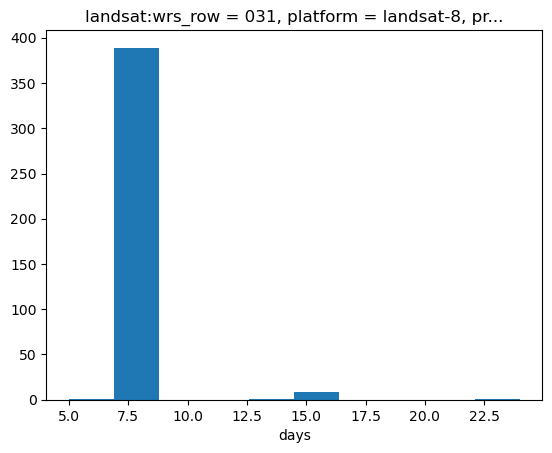

In [16]:
# What's the typical interval between scenes?
cloud_free_stack.time.diff("time").dt.days.plot.hist();

## Make biannual median composites

The Landsat-8 scenes appear to typically be 5-15 days apart. Let's composite that down to a 6-month interval.

Since the cloudy pixels we masked with NaNs will be ignored in the `median`, this should give us a decent cloud-free-ish image for each.

In [17]:
# Make biannual median composites (`2Q` means 2 quarters)
composites_stack = cloud_free_stack.resample(time="2Q").median("time")
composites_stack

<xarray.DataArray 'stackstac-a5d05ed841b7fe34bd4bf1fffead24d1' (time: 19,
                                                                band: 19,
                                                                y: 1538, x: 1627)> Size: 7GB
dask.array<stack, shape=(19, 19, 1538, 1627), dtype=float64, chunksize=(1, 1, 830, 877), chunktype=numpy.ndarray>
Coordinates: (12/13)
  * x                          (x) float64 13kB 3.969e+05 ... 4.456e+05
  * y                          (y) float64 12kB 4.634e+06 ... 4.588e+06
    landsat:wrs_row            <U3 12B '031'
    platform                   <U9 36B 'landsat-8'
    proj:epsg                  int64 8B 32619
    instruments                object 8B {'tirs', 'oli'}
    ...                         ...
    landsat:processing_level   <U4 16B 'L2SP'
    landsat:collection_number  <U2 8B '02'
    landsat:wrs_type           <U1 4B '2'
    epsg                       int64 8B 32619
  * band                       (band) object 152B 'coastal' ... 'SR_QA_AEROSOL'
  * time                       (time) datetime64[ns] 152B 2013-03-31 ... 2022...
Attributes:
    spec:        RasterSpec(epsg=32619, bounds=(396870.0, 4588200.0, 445680.0...
    crs:         epsg:32619
    transform:   | 30.00, 0.00, 396870.00|\n| 0.00,-30.00, 4634340.00|\n| 0.0...
    resolution:  30.0

Pick the red-green-blue bands to make a true-color image.

In [18]:
rgb_stack = composites_stack.sel(band=["red", "green", "blue"])
rgb_stack

<xarray.DataArray 'stackstac-a5d05ed841b7fe34bd4bf1fffead24d1' (time: 19,
                                                                band: 3,
                                                                y: 1538, x: 1627)> Size: 1GB
dask.array<getitem, shape=(19, 3, 1538, 1627), dtype=float64, chunksize=(1, 1, 830, 877), chunktype=numpy.ndarray>
Coordinates: (12/13)
  * x                          (x) float64 13kB 3.969e+05 ... 4.456e+05
  * y                          (y) float64 12kB 4.634e+06 ... 4.588e+06
    landsat:wrs_row            <U3 12B '031'
    platform                   <U9 36B 'landsat-8'
    proj:epsg                  int64 8B 32619
    instruments                object 8B {'tirs', 'oli'}
    ...                         ...
    landsat:processing_level   <U4 16B 'L2SP'
    landsat:collection_number  <U2 8B '02'
    landsat:wrs_type           <U1 4B '2'
    epsg                       int64 8B 32619
  * band                       (band) object 24B 'red' 'green' 'blue'
  * time                       (time) datetime64[ns] 152B 2013-03-31 ... 2022...
Attributes:
    spec:        RasterSpec(epsg=32619, bounds=(396870.0, 4588200.0, 445680.0...
    crs:         epsg:32619
    transform:   | 30.00, 0.00, 396870.00|\n| 0.00,-30.00, 4634340.00|\n| 0.0...
    resolution:  30.0

Some final cleanup to make a nicer-looking animation:

* Forward-fill any NaN pixels from the previous frame, to make the animation look less jumpy.
* Also skip the first frame, since its NaNs can't be filled from anywhere.

In [19]:
cleaned_stack = rgb_stack.ffill("time")[1:]

## Render the GIF

Use [GeoGIF](https://geogif.readthedocs.io/en/latest/) to turn the stack into an animation. We'll use [dgif](https://geogif.readthedocs.io/en/latest/api.html#dask-dgif) to render the GIF on the cluster, so there's less data to send back. (GIFs are a lot smaller than NumPy arrays!)

In [20]:
%%time
gif_img = geogif.dgif(cleaned_stack).compute()

/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/array/chunk.py:279: RuntimeWarning: invalid value encountered in cast
  return x.astype(astype_dtype, **kwargs)
/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/array/chunk.py:279: RuntimeWarning: invalid value encountered in cast
  return x.astype(astype_dtype, **kwargs)
/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/array/chunk.py:279: RuntimeWarning: invalid value encountered in cast
  return x.astype(astype_dtype, **kwargs)
/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/array/chunk.py:279: RuntimeWarning: invalid value encountered in cast
  return x.astype(astype_dtype, **kwargs)
/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/opt/conda/envs/dask_tutorial/lib/python3.12/site-packages/dask/utils.py:78: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwar

CPU times: user 28.5 s, sys: 2.98 s, total: 31.5 s
Wall time: 6min 33s


In [21]:
# we turned ~22GiB of data into a 12.3MB GIF!
dask.utils.format_bytes(len(gif_img.data))

'12.30 MiB'

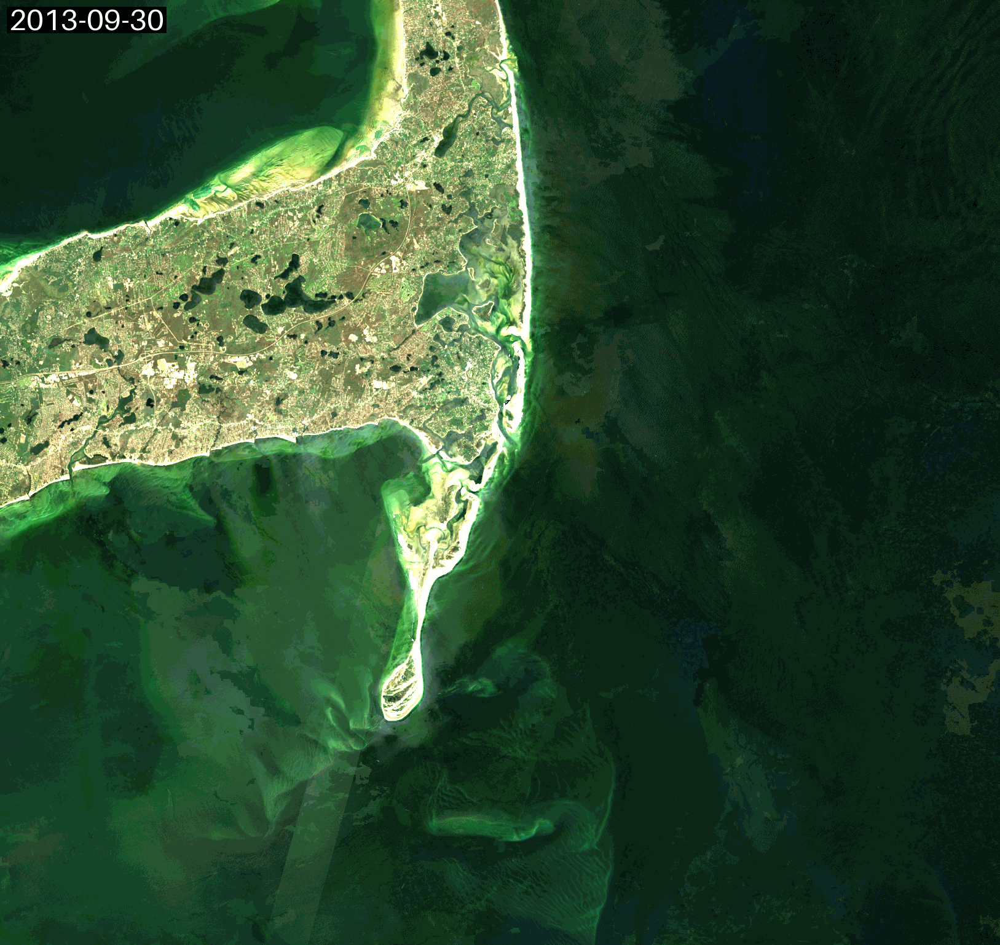

In [22]:
gif_img